In [1]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

from datetime import datetime
import requests
import seaborn as sns
sns.set()
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

import re

# IQR/Z score.
from scipy.stats import stats

# Seleción de variables.
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import LabelEncoder

# Modelos Selección.
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Modelos.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold

# Preprocesado.
from sklearn.preprocessing import MinMaxScaler

from imblearn.over_sampling import SMOTE
import pickle
# Métricas.
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report


# Intento sin depurar bien

Vamos a realizar un intento de depuración muy basico, usando LabelEncoder en training y test para hacer una "limpieza rapida" del dataset.

Sabemos que esto no se debe hacer, es simplemente generar una pequeña estructura con un preprocesado rapido y ver el score en el que nos encontramos, ya que nuestro trabajo en esta tarea es maximizar dicho score.

In [2]:
training_x = pd.read_csv("../Tarea/training_x.csv")
training_y = pd.read_csv("../Tarea/training_y.csv")
test_x = pd.read_csv("../Tarea/test_x.csv")
submission = pd.read_csv("../Tarea/SubmissionFormat.csv")

In [3]:
# Concatenamos el training_x con el training_y 
df = pd.merge(training_x, training_y, on = "id", how = "left")

In [4]:
training_x.id.duplicated().value_counts()

False    59400
Name: id, dtype: int64

In [5]:
df["region_code"] = df["region_code"].astype("category")
df["district_code"] = df["district_code"].astype("category")

test_x["region_code"] = test_x["region_code"].astype("category")
test_x["district_code"] = test_x["district_code"].astype("category")

In [6]:
cat_cols= df.select_dtypes(include=['object','category']).columns
num_cols = df.select_dtypes(exclude=['object','category']).columns

In [7]:
le = LabelEncoder()
for i in cat_cols:
    le.fit(df[i].unique())
    df[i] = le.transform(df[i])

In [8]:
df.isnull().sum()

id                       0
amount_tsh               0
date_recorded            0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
s

In [9]:
cat_cols_x= test_x.select_dtypes(include=['object','category']).columns
num_cols_x = test_x.select_dtypes(exclude=['object','category']).columns

In [10]:
for i in cat_cols_x:
    le = LabelEncoder()
    le.fit(test_x[i].unique())
    test_x[i] = le.transform(test_x[i])

In [11]:
var_y = df["status_group"]
df.drop("status_group", axis=1, inplace = True)

In [12]:
model = RandomForestClassifier().fit(df,var_y)
y_pred = model.predict(test_x)

In [13]:
y_pred

array([2, 0, 0, ..., 0, 0, 2])

In [14]:
prediction = pd.DataFrame(test_x["id"],columns = ["id"])

In [15]:
prediction["status_group"] = y_pred

In [16]:
prediction.status_group.replace((0,1,2),("functional","functional needs repair","non functional"), inplace=True)

In [17]:
prediction.sort_values(by=["status_group"])

,id,status_group
7424,19540,functional
7082,73988,functional
12392,53079,functional
7084,29207,functional
7085,47081,functional
...,...,...
7302,30947,non functional
7301,39991,non functional
7300,35703,non functional
7335,13909,non functional


In [18]:
prediction.to_csv("Subformat.csv", index=False)

Con esta predicción, hemos conseguido un **0.8045**

# Comenzamos con la tarea

Al haber realizado una primera prueba sin mucho esfuerzo y haber conseguido un resultado por encima del 0.80, comenzamos a realizar el ejercicio con una buena depuración para incrementar dicho score.

Para ello, cargamos los csv y comprobaremos sus registros con el fin de realizar la depuración a un único dataset que englobe los tres disponibles.

In [19]:
training_x = pd.read_csv("../Tarea/training_x.csv")
training_y = pd.read_csv("../Tarea/training_y.csv")
test_x = pd.read_csv("../Tarea/test_x.csv")

In [20]:
training_x.shape

(59400, 40)

In [21]:
test_x.shape

(14850, 40)

In [22]:
training_y

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


In [23]:
# Valoramos si son los mismos id en ambos conjuntos de training asi como en training y test

print("Cantidad de id en training_y respecto training_x:\n",training_x["id"].isin(training_y["id"]).value_counts())
print("Cantidad de id en test_x respecto training_x:\n",training_x["id"].isin(test_x["id"]).value_counts())

Cantidad de id en training_y respecto training_x:
 True    59400
Name: id, dtype: int64
Cantidad de id en test_x respecto training_x:
 False    59400
Name: id, dtype: int64


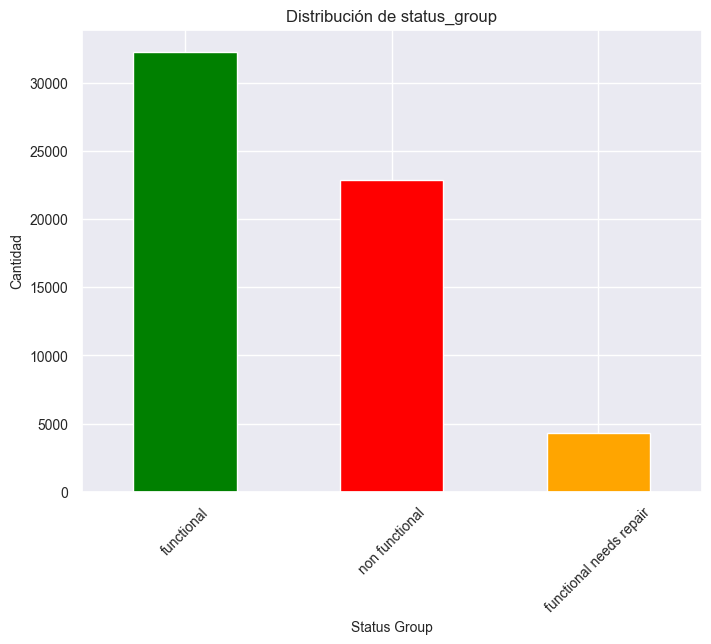

In [24]:
status_group_counts = training_y['status_group'].value_counts()

plt.figure(figsize=(8, 6))
status_group_counts.plot(kind='bar', color=['green', 'red', 'orange'])
plt.title('Distribución de status_group')
plt.xlabel('Status Group')
plt.ylabel('Cantidad')
plt.xticks(rotation=45)
plt.show()

Al pintar nuestra "y", vemos que hay un claro desbalanceo de clases por parte de "functional needs repair".

A partir de aquí, concatenaremos los 3 datasets en 1, de esta forma podemos ahorrar tiempo en la depuración al poder preprocesar todos los datos a la vez.

Adicionalmente, para no perder los registros, vamos a crear una nueva columna que acabaremos eliminando al final de todo el ejercicio llamada "diferenciar". En ella, podemos diferenciar los registros originales de training de los de test.

In [25]:
# Concatenamos el training_x con el training_y, asi como con el test_x para tener todo en el mismo dataframe
df = pd.merge(training_x, training_y, on = "id", how = "left")
df["diferenciar"] = "training"
df = pd.concat([df,test_x])
df["diferenciar"].fillna("test",inplace=True)
df.reset_index()

,index,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,diferenciar
0,0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,training
1,1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,...,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,training
2,2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,...,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,training
3,3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,...,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,training
4,4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,...,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,training
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74245,14845,39307,0.0,2011-02-24,Danida,34,Da,38.852669,-6.582841,Kwambwezi,...,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,NaN,test
74246,14846,18990,1000.0,2011-03-21,Hiap,0,HIAP,37.451633,-5.350428,Bonde La Mkondoa,...,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,test
74247,14847,28749,0.0,2013-03-04,NaN,1476,NaN,34.739804,-4.585587,Bwawani,...,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe,NaN,test
74248,14848,33492,0.0,2013-02-18,Germany,998,DWE,35.432732,-10.584159,Kwa John,...,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,NaN,test


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     74250 non-null  int64  
 1   amount_tsh             74250 non-null  float64
 2   date_recorded          74250 non-null  object 
 3   funder                 69746 non-null  object 
 4   gps_height             74250 non-null  int64  
 5   installer              69718 non-null  object 
 6   longitude              74250 non-null  float64
 7   latitude               74250 non-null  float64
 8   wpt_name               74250 non-null  object 
 9   num_private            74250 non-null  int64  
 10  basin                  74250 non-null  object 
 11  subvillage             73780 non-null  object 
 12  region                 74250 non-null  object 
 13  region_code            74250 non-null  int64  
 14  district_code          74250 non-null  int64  
 15  lg

In [27]:
prof = ProfileReport(df)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Aquí ya comenzamos a ver cosas interesantes:

1- Me preocupa el gran numero de variables categóricas que existen, ya que la gran mayoría **presentan demasiadas categorías** (subvillage la que más con 19287, habra que ver como abordamos el problema). Además de ello, hay categorias presentes que figuran como **missings no declarados**, pero se me ha ocurrido que si conseguimos recategorizar en un menor numero de categorías, podemos imputar esos missings en la categoróa "other" ya que no pertenecen a ninguna categoría mayoritaria.

2- Existe presencialidad de registros con 0, algunos para mi correctos y otros que no aportan al modelo. De los correctos, estaría por ejemplo amount_tsh o population, ya que la cantidad de agua que hay en el pozo puede ser 0 al igual  que un lugar puede tener un pozo estar inhabitado. Por otro lado, variables como longitud o construction year presentan 0 como missings no declarados, habra que imputarlos en un futuro.

3- Tambien encontramos variables que aparentemente explican lo mismo. Como el resultado de este ejercicio es conseguir la mayor puntuación posible en el concurso, valoraremos si eliminar o dejar dichas variables en función de los resultados arrojados más adelante en el proceso.

A partir de este punto se me ocurren 2 cosas, la primera el **separar en columnas categoricas y numericas** para poder trabajar mejor con el proceso de depuración, así como mirar correctamente tanto el **numero como porcentaje de missings.**

In [28]:
df["region_code"] = df["region_code"].astype("category")
df["district_code"] = df["district_code"].astype("category")
df["date_recorded"] = pd.to_datetime(df["date_recorded"])

In [29]:
cat_cols= df.select_dtypes(include=['object','category']).columns
num_cols = df.select_dtypes(exclude=['object','category']).columns

In [30]:
df[num_cols].describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,population,construction_year
count,74250.000000,74250.000000,74250.000000,74250.000000,7.425000e+04,74250.000000,74250.000000,74250.000000
mean,37124.500000,318.685704,665.667313,34.074262,-5.701771e+00,0.462330,180.750828,1298.463650
std,21434.273081,2906.762364,692.761033,6.572519,2.944969e+00,11.537879,471.086120,952.349375
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,0.000000,0.000000
25%,18562.250000,0.000000,0.000000,33.086819,-8.525675e+00,0.000000,0.000000,0.000000
50%,37124.500000,0.000000,364.000000,34.907475,-5.026540e+00,0.000000,25.000000,1986.000000
75%,55686.750000,20.000000,1317.000000,37.181685,-3.325058e+00,0.000000,215.000000,2004.000000
max,74249.000000,350000.000000,2777.000000,40.345193,-2.000000e-08,1776.000000,30500.000000,2013.000000


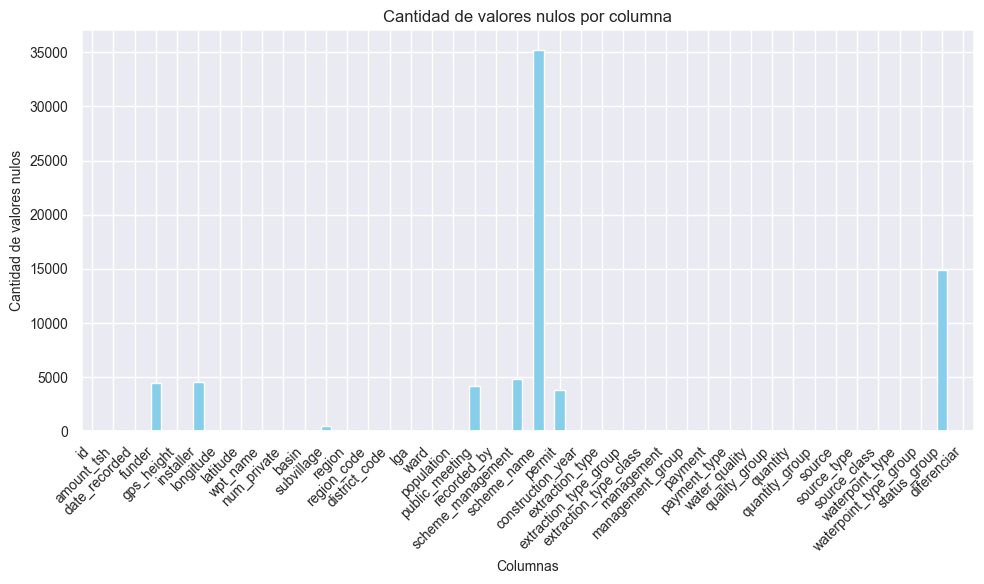

In [31]:
null_counts = df.isnull().sum()

plt.figure(figsize=(10, 6))
null_counts.plot(kind='bar', color='skyblue')
plt.title('Cantidad de valores nulos por columna')
plt.xlabel('Columnas')
plt.ylabel('Cantidad de valores nulos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

In [32]:
df.apply(lambda x: x.isna().sum()/x.count()*100)

id                        0.000000
amount_tsh                0.000000
date_recorded             0.000000
funder                    6.457718
gps_height                0.000000
installer                 6.500473
longitude                 0.000000
latitude                  0.000000
wpt_name                  0.000000
num_private               0.000000
basin                     0.000000
subvillage                0.637029
region                    0.000000
region_code               0.000000
district_code             0.000000
lga                       0.000000
ward                      0.000000
population                0.000000
public_meeting            5.927670
recorded_by               0.000000
scheme_management         6.982306
scheme_name              90.423677
permit                    5.383425
construction_year         0.000000
extraction_type           0.000000
extraction_type_group     0.000000
extraction_type_class     0.000000
management                0.000000
management_group    

In [33]:
df.nunique()

id                       74250
amount_tsh                 102
date_recorded              369
funder                    2140
gps_height                2456
installer                 2410
longitude                71870
latitude                 71869
wpt_name                 45684
num_private                 68
basin                        9
subvillage               21425
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2098
population                1128
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name               2868
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_

La gráfica nos indica el número total de missings que hay, mientras que el codigo que hay justo abajo representa lo mismo pero en porcentaje.

Por último, se extráe la totalidad de valores únicos por variable por tener una ayuda sobre como recategorizar aquellas variables que sean categóricas.

Vemos que realmente para la gran cantidad de variables existente, no hay demasiado missing declarado, por lo que vamos a seguir enfocando la depuración primero en aquellas variables categóricas con missings, las cuales valoraremos si eliminar o recategorizar a un menor número de categorías, llegando a imputar así los datos faltantes a un nuevo registro llamado "other".

# Estudio de categorias y tratamiento de missings

- A partir de aquí, vamos a ir variable por variable que presente missings:

In [34]:
# Eliminamos ya que no podemos imputar un 90% de missings
df.drop("scheme_name", axis=1, inplace=True)

**Comenzamos con funder**

In [35]:
df.funder.value_counts().head(15)

Government Of Tanzania    11299
Danida                     3907
Hesawa                     2782
Rwssp                      1703
World Bank                 1701
Kkkt                       1623
World Vision               1562
Unicef                     1324
Tasaf                      1136
Dhv                        1065
District Council           1037
Private Individual         1034
Dwsp                       1012
0                           980
Norad                       949
Name: funder, dtype: int64

In [36]:
# Decido escoger las 13 primeros para así no perder tantos registros importantes (> 1000) en la recategorización
fund = df["funder"].value_counts().index.tolist()[:13]
df["funder"] = df["funder"].apply(lambda x: x if x in fund else "Other")
df["funder"] = df["funder"].fillna("Other")

In [37]:
df.funder.value_counts()

Other                     43065
Government Of Tanzania    11299
Danida                     3907
Hesawa                     2782
Rwssp                      1703
World Bank                 1701
Kkkt                       1623
World Vision               1562
Unicef                     1324
Tasaf                      1136
Dhv                        1065
District Council           1037
Private Individual         1034
Dwsp                       1012
Name: funder, dtype: int64

**Seguimos con installer**

In [38]:
df.installer.value_counts().head(10)

DWE           21751
Government     2282
RWE            1498
Commu          1347
DANIDA         1305
KKKT           1120
Hesawa         1070
0               980
TCRS            887
CES             765
Name: installer, dtype: int64

In [39]:
# Mismo criterio que antes (valores >1000 con categoria)
installer = df["installer"].value_counts().index.tolist()[:7]
df["installer"] = df["installer"].apply(lambda x: x if x in installer else "Other")
df["installer"] = df["installer"].fillna("Other")

In [40]:
df.installer.value_counts()

Other         43877
DWE           21751
Government     2282
RWE            1498
Commu          1347
DANIDA         1305
KKKT           1120
Hesawa         1070
Name: installer, dtype: int64

**Seguimos con subvillage**

In [41]:
df.subvillage.value_counts().head(30)

Shuleni       646
Majengo       631
Madukani      629
Kati          467
Mtakuja       322
Sokoni        294
M             243
Muungano      215
Mbuyuni       210
Songambele    194
Mlimani       190
Miembeni      168
Msikitini     164
1             157
Kanisani      146
Kibaoni       143
Mjini         131
Mjimwema      129
Mapinduzi     126
Mkwajuni      125
Mwenge        125
I             124
Bondeni       121
Azimio        116
Amani         115
Mabatini      114
Mbugani       113
Senta         111
Kichangani    110
Mission       110
Name: subvillage, dtype: int64

In [42]:
# No parece ser lo suficientemente significativa, me planteo si eliminarla mas abajo en el proceso
subvillage = df.subvillage.value_counts(normalize=True)
subvillage

Shuleni       0.008756
Majengo       0.008552
Madukani      0.008525
Kati          0.006330
Mtakuja       0.004364
                ...   
Kalipinde     0.000014
Isimikine     0.000014
Bukiliguru    0.000014
Busulilo      0.000014
Kosoro        0.000014
Name: subvillage, Length: 21425, dtype: float64

Subvillage para mi no tiene la suficiente representatividad en ninguna de sus categorias, no se si va a ser lo suficientemente buena para el modelo.

Adicionalmente, aunque no es la que tiene mayor numero de categorías, si que es cierto que presenta 19287 por lo que de momento la dejo para ver como sigue el preprocesado de las variables categoricas, pero tengo en mi cabeza la idea continua de eliminarla en un futuro muy seguramente.

**Seguimos con public_meeting**

In [43]:
df.public_meeting.isna().value_counts()

False    70095
True      4155
Name: public_meeting, dtype: int64

In [44]:
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
import feature_engine.imputation as fe_imp

# Aleatoria: numéricas y nominales
imputer_rand = fe_imp.RandomSampleImputer()

#Pasamos a 0 y 1
df['public_meeting'] = df['public_meeting'].replace({True: 1, False: 0})

df['public_meeting'] = imputer_rand.fit_transform(df[['public_meeting']])

# Convertimos los valores imputados nuevamente a valores booleanos
df['public_meeting'] = df['public_meeting'].astype(bool)

In [45]:
df.public_meeting.value_counts()

True     67538
False     6712
Name: public_meeting, dtype: int64

He decidido imputar por el RandomSampleImputer con el fin de intentar preservar lo maximo posible la distribución y evitar sesgos, cargando una de las categorías demasiado.

**Seguimos con scheme_management**

In [46]:
df.scheme_management.value_counts(normalize=True)

VWC                 0.661590
WUG                 0.093597
Water authority     0.057273
WUA                 0.051164
Water Board         0.049882
Parastatal          0.030603
Company             0.019322
Private operator    0.019106
Other               0.014351
SWC                 0.001772
Trust               0.001326
None                0.000014
Name: scheme_management, dtype: float64

In [47]:
freq = df.scheme_management.value_counts(normalize=True)

freq_cat = [x for x in freq.loc[freq > 0.05].index.values]

df["scheme_management"] = np.where(df["scheme_management"].isin(freq_cat), df["scheme_management"], "Other")

df.scheme_management.value_counts()

VWC                45917
Other              14311
WUG                 6496
Water authority     3975
WUA                 3551
Name: scheme_management, dtype: int64

En este caso, al no tener demasiado numero de categorías, pero ver que hay una muy baja representatividad en muchas de ellas, he decidido hacer la recategorización a través de las frecuencias de cada una, asignando como valor limítrofe el 0.05.

**Seguimos con permit**

In [48]:
#Pasamos a 0 y 1
df['permit'] = df['permit'].replace({True: 1, False: 0})

df['permit'] = imputer_rand.fit_transform(df[['permit']])

# Convertimos los valores imputados nuevamente a valores booleanos
df['permit'] = df['permit'].astype(bool)

Al igual que hemos hecho con public meeting, aplicamos un RandomSimpleImputer con el fin de mantener la distribución de los datos y reducir el posible sesgo.

A partir de aquí, se decide eliminar subvillage debido a que tiene demasiadas categorías con muy baja representatividad (la que más 0.008).

Se reconfiguran a categoricas todas y cada una de las variables que hemos depurado de manera individual.

In [49]:
lista = ["funder","installer","public_meeting","scheme_management","permit"]
for i in lista:
    df[i] = df[i].astype('category')

In [50]:
# Eliminamos subvillage debido a que tiene demasiadas categorias y ninguna significativa (la que mas 0.08% de representacion)
df.drop("subvillage", axis=1, inplace=True)

In [51]:
df.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                       0
gps_height                   0
installer                    0
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting               0
recorded_by                  0
scheme_management            0
permit                       0
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity                     0
quantity

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     74250 non-null  int64         
 1   amount_tsh             74250 non-null  float64       
 2   date_recorded          74250 non-null  datetime64[ns]
 3   funder                 74250 non-null  category      
 4   gps_height             74250 non-null  int64         
 5   installer              74250 non-null  category      
 6   longitude              74250 non-null  float64       
 7   latitude               74250 non-null  float64       
 8   wpt_name               74250 non-null  object        
 9   num_private            74250 non-null  int64         
 10  basin                  74250 non-null  object        
 11  region                 74250 non-null  object        
 12  region_code            74250 non-null  category      
 13  d

In [53]:
df.nunique()

id                       74250
amount_tsh                 102
date_recorded              369
funder                      14
gps_height                2456
installer                    8
longitude                71870
latitude                 71869
wpt_name                 45684
num_private                 68
basin                        9
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2098
population                1128
public_meeting               2
recorded_by                  1
scheme_management            5
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity

Es interesante ver como subvillage y wpt_name son variables que tienen demasiadas categorías, razon por la que hemos eliminado la primera.

Sin embargo, voy a dejar wpt_name debido a que al menos si que presenta registros con una representatividad ligeramente superior a subvillage desde un inicio.

Más adelante de este proceso, una vez hayamos depurado outliers y tengamos todo el dataset practicamente limpio, se va a realizar un automatismo en donde a las variables menores de x categorias (aun por definir, puede que sea 10,15... probare para ver que es lo que mejor le sienta al modelo en términos de score del concurso) se le aplicará un label encoder mientras que aquellas que tengan un numero mayor a x categorias sus registros serán cambiados por la frecuencia de aparición, produciendo así también una reducción en el numero de categorías por variable y reducciendo el impacto por pérdida de información.

In [54]:
df.wpt_name.value_counts(normalize=True)

none                      0.059798
Shuleni                   0.029401
Zahanati                  0.013926
Msikitini                 0.008714
Kanisani                  0.005253
                            ...   
Shule Ya Msingi Bitale    0.000013
Isyeto                    0.000013
Kituo Cha Liheta          0.000013
Kwa Juma Lukanda          0.000013
Kwa Mzee Chagala          0.000013
Name: wpt_name, Length: 45684, dtype: float64

In [55]:
df.nunique()

id                       74250
amount_tsh                 102
date_recorded              369
funder                      14
gps_height                2456
installer                    8
longitude                71870
latitude                 71869
wpt_name                 45684
num_private                 68
basin                        9
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2098
population                1128
public_meeting               2
recorded_by                  1
scheme_management            5
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity

In [56]:
cat_cols= df.select_dtypes(include=['object','category']).columns
num_cols = df.select_dtypes(exclude=['object','category']).columns

In [57]:
cat_cols

Index(['funder', 'installer', 'wpt_name', 'basin', 'region', 'region_code',
       'district_code', 'lga', 'ward', 'public_meeting', 'recorded_by',
       'scheme_management', 'permit', 'extraction_type',
       'extraction_type_group', 'extraction_type_class', 'management',
       'management_group', 'payment', 'payment_type', 'water_quality',
       'quality_group', 'quantity', 'quantity_group', 'source', 'source_type',
       'source_class', 'waterpoint_type', 'waterpoint_type_group',
       'status_group', 'diferenciar'],
      dtype='object')

In [58]:
df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group,diferenciar
0,69572,6000.0,2011-03-14,Other,1390,Other,34.938093,-9.856322,none,0,...,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional,training
1,8776,0.0,2013-03-06,Other,1399,Other,34.698766,-2.147466,Zahanati,0,...,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,training
2,34310,25.0,2013-02-25,Other,686,Other,37.460664,-3.821329,Kwa Mahundi,0,...,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional,training
3,67743,0.0,2013-01-28,Unicef,263,Other,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional,training
4,19728,0.0,2011-07-13,Other,0,Other,31.130847,-1.825359,Shuleni,0,...,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional,training
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,39307,0.0,2011-02-24,Danida,34,Other,38.852669,-6.582841,Kwambwezi,0,...,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,NaN,test
14846,18990,1000.0,2011-03-21,Other,0,Other,37.451633,-5.350428,Bonde La Mkondoa,0,...,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,test
14847,28749,0.0,2013-03-04,Other,1476,Other,34.739804,-4.585587,Bwawani,0,...,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe,NaN,test
14848,33492,0.0,2013-02-18,Other,998,DWE,35.432732,-10.584159,Kwa John,0,...,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,NaN,test


# Estudio de las numéricas, fechas, outliers y tratamiento de 0

In [59]:
(df[num_cols] == 0).sum()

id                       1
amount_tsh           52049
date_recorded            0
gps_height           25649
longitude             2269
latitude                 0
num_private          73299
population           26834
construction_year    25969
dtype: int64

In [60]:
(df[num_cols][df[num_cols] == 0].count() / len(df)) * 100

id                    0.001347
amount_tsh           70.099663
date_recorded         0.000000
gps_height           34.544108
longitude             3.055892
latitude              0.000000
num_private          98.719192
population           36.140067
construction_year    34.975084
dtype: float64

Vemos claramente que num private tiene demasiados 0, pasarlos a np.nan e imputar no es una opción, por lo que eliminaremos la variable. Además, una variable que tenga en su gran mayoría el mismo registro no aportará mucho al modelo.

Por otro lado, vemos que amount_tsh, gps_height y population son variables con gran cantidad de 0, pero no por ello se deberían imputar. Mi filosofía con estas 3 es dejarlas como están. Amount_tsh puede tener valor 0 si el pozo está seco, population puede ser 0 ya que pueden existir regiones inhabitadas actualmente con un pozo que este seco. Por último, gps_height es la altitud a la que se encuentra el pozo respecto al nivel del mar, por lo que también puede llegar a ser 0 en zonas costeras.

Por último, longitude y construction_year no pueden llegar a ser 0, ya que en el caso de longitud si tuviese coordenada 0 no se situaría sobre Tanzania, así como logicamente el año de construcción no tiene sentido que fuese 0 por razones obvias.

Esto nos da la info suficiente como para saber que los 0 de longitude y construction_year debemos pasarlos a np.nan e imputarlos, haremos imputación por cadenas de Markov para el primero y random para el segundo.

In [61]:
df["longitude"].replace(0,np.nan, inplace = True)

In [62]:
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Crear el imputador iterativo
imputer_itImp = IterativeImputer(max_iter=10, random_state=0)

# Imputar la columna "latitude" en el DataFrame original
df['longitude'] = imputer_itImp.fit_transform(df[['longitude']])

# Ver información del DataFrame imputado
print(df['longitude'].info())

<class 'pandas.core.series.Series'>
Int64Index: 74250 entries, 0 to 14849
Series name: longitude
Non-Null Count  Dtype  
--------------  -----  
74250 non-null  float64
dtypes: float64(1)
memory usage: 3.1 MB
None


In [63]:
cons = df.construction_year
for i in cons:
    if i == 0:
        cons.replace(0,np.nan,inplace=True)
        
df["construction_year"] = cons

df['construction_year'] = imputer_rand.fit_transform(df[['construction_year']])

In [64]:
df.construction_year.astype("int64")

0        1999
1        2010
2        2009
3        1986
4        2005
         ... 
14845    1988
14846    1994
14847    2010
14848    2009
14849    2008
Name: construction_year, Length: 74250, dtype: int64

In [65]:
df.drop("num_private", axis=1, inplace = True)
num_cols = num_cols.drop("num_private")

Vamos a usar una función de guille para detectar outliers y poder winsorizarlos en caso de que haya:

In [66]:
## Función manual de winsor con clip+quantile 
def winsorize_with_pandas(s, limits):
    """
    s : pd.Series
        Series to winsorize
    limits : tuple of float
        Tuple of the percentages to cut on each side of the array, 
        with respect to the number of unmasked data, as floats between 0. and 1
    """
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'), 
                  upper=s.quantile(1-limits[1], interpolation='higher'))

from scipy import stats

## Función para gestionar outliers
def gestiona_outliers(col,clas = 'check'):
     print(col.name)
     # Condición de asimetría y aplicación de criterio 1 según el caso
     if abs(col.skew()) < 1:
        criterio1 = abs((col-col.mean())/col.std())>3
     else:
        criterio1 = abs((col-col.median())/stats.median_abs_deviation(col))>8 ## Cambio mad por median_abs_deviation!! 
     
     # Calcular primer cuartil     
     q1 = col.quantile(0.25)  
     # Calcular tercer cuartil  
     q3 = col.quantile(0.75)
     # Calculo de IQR
     IQR=q3-q1
     # Calcular criterio 2 (general para cualquier asimetría)
     criterio2 = (col<(q1 - 3*IQR))|(col>(q3 + 3*IQR))
     lower = col[criterio1&criterio2&(col<q1)].count()/col.dropna().count()
     upper = col[criterio1&criterio2&(col>q3)].count()/col.dropna().count()
     # Salida según el tipo deseado
     if clas == 'check':
            return(lower*100,upper*100,(lower+upper)*100)
     elif clas == 'winsor':
            return(winsorize_with_pandas(col,(lower,upper)))
     elif clas == 'miss':
            print('\n MissingAntes: ' + str(col.isna().sum()))
            col.loc[criterio1&criterio2] = np.nan
            print('MissingDespues: ' + str(col.isna().sum()) +'\n')
            return(col)


In [67]:
df[num_cols].select_dtypes(include=np.number).copy().apply(lambda x: gestiona_outliers(x))

id
amount_tsh
gps_height
longitude
latitude
population
construction_year


,id,amount_tsh,gps_height,longitude,latitude,population,construction_year
0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
1,0.0,18.747475,0.0,0.0,0.0,3.325253,0.0
2,0.0,18.747475,0.0,0.0,0.0,3.325253,0.0


Correcto, vemos outliers en amount_tsh y population por la derecha de la distribución, 18.74% y 3.32% respectivamente.

Viendo esto, decido aplicar winsorización para poder ajustar dichos outliers a las colas de las distribuciones de ambas variables, creando un nuevo dataset de columnas numericas que mas adelante concatenaremos con nuestro dataset original, eliminando previamente los registros originales de estas columnas para poder añadir los registros ya winsorizados:

In [68]:
df_clean = df[num_cols].select_dtypes(include=np.number).copy().apply(lambda x: gestiona_outliers(x,clas='winsor'))
df_clean

id
amount_tsh
gps_height
longitude
latitude
population
construction_year


,id,amount_tsh,gps_height,longitude,latitude,population,construction_year
0,69572,100.0,1390,34.938093,-9.856322,109,1999.0
1,8776,0.0,1399,34.698766,-2.147466,280,2010.0
2,34310,25.0,686,37.460664,-3.821329,250,2009.0
3,67743,0.0,263,38.486161,-11.155298,58,1986.0
4,19728,0.0,0,31.130847,-1.825359,0,2005.0
...,...,...,...,...,...,...,...
14845,39307,0.0,34,38.852669,-6.582841,20,1988.0
14846,18990,100.0,0,37.451633,-5.350428,861,1994.0
14847,28749,0.0,1476,34.739804,-4.585587,200,2010.0
14848,33492,0.0,998,35.432732,-10.584159,150,2009.0


In [69]:
df["population"].max()

30500

In [70]:
df_clean.population.max()

861

In [71]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 74250 non-null  int64  
 1   amount_tsh         74250 non-null  float64
 2   gps_height         74250 non-null  int64  
 3   longitude          74250 non-null  float64
 4   latitude           74250 non-null  float64
 5   population         74250 non-null  int64  
 6   construction_year  74250 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 6.5 MB


In [72]:
df.drop(["id","amount_tsh","gps_height","longitude","latitude","population","construction_year"], inplace=True, axis=1)
df = pd.concat([df, df_clean], axis=1)

En cuanto a fechas, vamos a crear 3 nuevas variables que suelen mejorar la puntuación del modelo. Escogeremos cada fecha en cuestión y la dividiremos en 3 columnas con días, mes y año respectivamente.

In [73]:
pd.to_datetime(df.date_recorded)

0       2011-03-14
1       2013-03-06
2       2013-02-25
3       2013-01-28
4       2011-07-13
           ...    
14845   2011-02-24
14846   2011-03-21
14847   2013-03-04
14848   2013-02-18
14849   2013-02-13
Name: date_recorded, Length: 74250, dtype: datetime64[ns]

In [74]:
fecha = df["date_recorded"].dt.strftime('%Y-%m-%d')
fecha = fecha.str.split("-")
df["days_recorded"] = [i[2] for i in fecha]
df["month_recorded"] = [i[1] for i in fecha]
df["year_recorded"] = [i[0] for i in fecha]

In [75]:
df

,date_recorded,funder,installer,wpt_name,basin,region,region_code,district_code,lga,ward,...,id,amount_tsh,gps_height,longitude,latitude,population,construction_year,days_recorded,month_recorded,year_recorded
0,2011-03-14,Other,Other,none,Lake Nyasa,Iringa,11,5,Ludewa,Mundindi,...,69572,100.0,1390,34.938093,-9.856322,109,1999.0,14,03,2011
1,2013-03-06,Other,Other,Zahanati,Lake Victoria,Mara,20,2,Serengeti,Natta,...,8776,0.0,1399,34.698766,-2.147466,280,2010.0,06,03,2013
2,2013-02-25,Other,Other,Kwa Mahundi,Pangani,Manyara,21,4,Simanjiro,Ngorika,...,34310,25.0,686,37.460664,-3.821329,250,2009.0,25,02,2013
3,2013-01-28,Unicef,Other,Zahanati Ya Nanyumbu,Ruvuma / Southern Coast,Mtwara,90,63,Nanyumbu,Nanyumbu,...,67743,0.0,263,38.486161,-11.155298,58,1986.0,28,01,2013
4,2011-07-13,Other,Other,Shuleni,Lake Victoria,Kagera,18,1,Karagwe,Nyakasimbi,...,19728,0.0,0,31.130847,-1.825359,0,2005.0,13,07,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,2011-02-24,Danida,Other,Kwambwezi,Wami / Ruvu,Pwani,6,1,Bagamoyo,Yombo,...,39307,0.0,34,38.852669,-6.582841,20,1988.0,24,02,2011
14846,2011-03-21,Other,Other,Bonde La Mkondoa,Pangani,Tanga,4,7,Kilindi,Mvungwe,...,18990,100.0,0,37.451633,-5.350428,861,1994.0,21,03,2011
14847,2013-03-04,Other,Other,Bwawani,Internal,Singida,13,2,Singida Rural,Ughandi,...,28749,0.0,1476,34.739804,-4.585587,200,2010.0,04,03,2013
14848,2013-02-18,Other,DWE,Kwa John,Lake Nyasa,Ruvuma,10,2,Songea Rural,Maposeni,...,33492,0.0,998,35.432732,-10.584159,150,2009.0,18,02,2013


# Distribuimos categoricas con mayor numero de categorias por frecuencia, preparamos LabelEncoder y separamos training test

Como comenté anteriormente, y habiendo realizado pruebas con 10, 12, 15 y 20, se define para este ejercicio cuyo objetivo no es otro más que intentar obtener la mayor puntuación en el concurso el que las variables categóricas por debajo de 15 categorias se le aplicará un label enconder mientras aquellas variables superiores a 15 se sustituirá sus valores por la frecuencia de aparición.

Se que 15 son demasiadas categorías para una categorica, pero como bien he comentado antes, de esta forma obtenemos mayor puntuación en el concurso. En mi opinión, el límite debería ser 10 como mucho 12, pero habiendolo intentado de esa forma me quedo más cerca de una puntuación de 0.81 que de 0.82.

**Importante:** estamos aplicando LabelEnconder a todo lo que tenga menos de 15 categorias y nuestra "y" entra dentro de dicha descripción. Como el LabelEnconder se aplica por orden alfabetico, nuestras clases son las siguientes:
- Functional: 0
- Functional needs repair: 1
- Non functional: 2

In [76]:
for i in cat_cols:
    if df[i].nunique() > 15:
        frecuencia_categorica = df[i].value_counts()
        df[i] = df[i].map(frecuencia_categorica)

In [77]:
cat_cols_list = cat_cols.tolist()  # Convierte el índice en una lista
cat_cols_list.remove("diferenciar")  # Elimina el elemento "diferenciar" de la lista
cat_cols = pd.Index(cat_cols_list)  # Convierte la lista de nuevo en un índice

In [78]:
for i in cat_cols:
    if df[i].nunique() <= 15:
        le = LabelEncoder()
        df[i] = le.fit_transform(df[i])

C:\Users\Usuario\AppData\Local\Temp\ipykernel_37536\2697067523.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


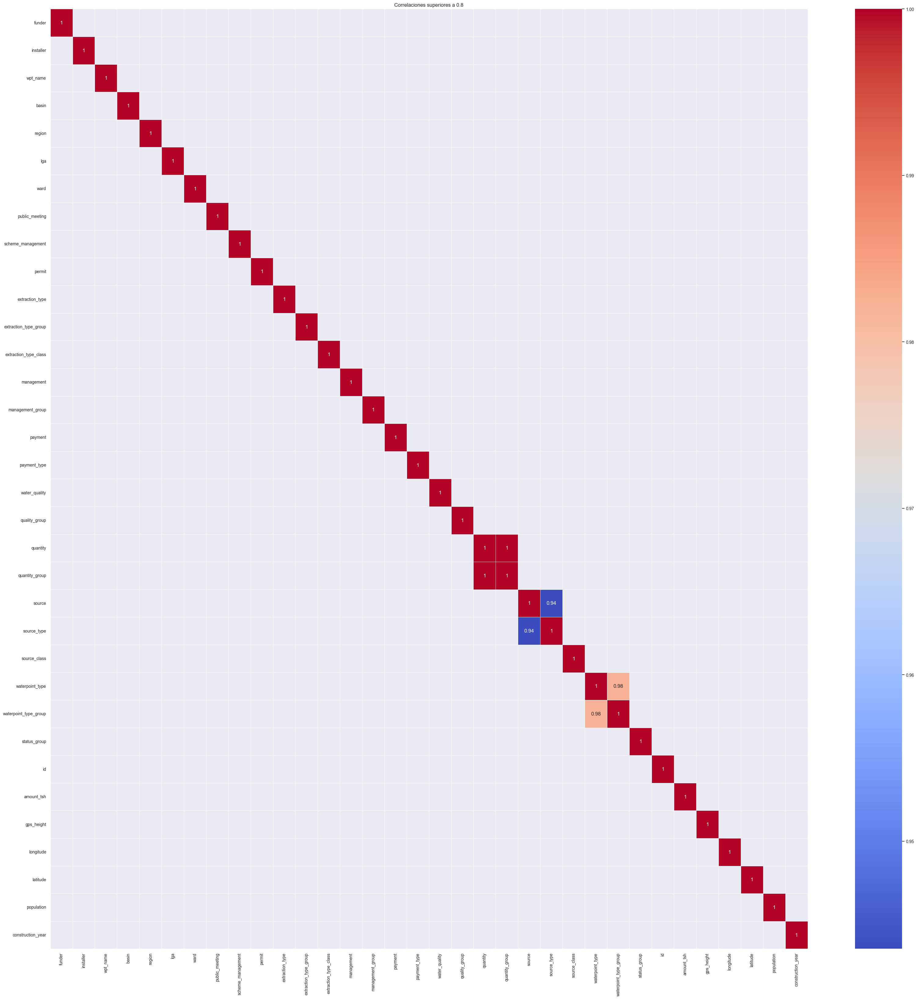

In [79]:
# Calcular la matriz de correlación
correlation_matrix = df.corr()

# Filtrar las correlaciones superiores a 0.8
high_correlation = correlation_matrix[abs(correlation_matrix) > 0.8]
high_correlation = high_correlation.dropna(how='all', axis=1).dropna(how='all', axis=0)

# Crear un mapa de calor con Seaborn para las correlaciones seleccionadas
plt.figure(figsize=(40, 40))
sns.heatmap(high_correlation, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlaciones superiores a 0.8')
plt.show()

Aplicamos una función de una matriz de correlación con ayuda del ChatGPT en la que se nos muestra especificamente aquellas variables que tengan un porcentaje de correlación del 0.8. Vemos que hay ciertas variables que muestran colinealidad al estar por encima de dicho valor.

Mas que por ver colinealidad, es por detectar de forma rápida variables que esten explicando lo mismo, lo que nos aporta duplicidad de información como puede ser quantity con quantity_group, dos formas de explicar la misma variable y que tienen correlación de 1.

Como el objetivo es obtener la mayor puntuación en el concurso, he realizado la prueba de lanzar el modelo con dichas variables y sin ellas, pero obtengo mayor puntuación dejandolas por lo que no vamos a realizarles el .drop().

Aun con todo, nos faltaría eliminar date_recorded ya que tenemos las fechas separadas en 3 variables.

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date_recorded          74250 non-null  datetime64[ns]
 1   funder                 74250 non-null  int32         
 2   installer              74250 non-null  int32         
 3   wpt_name               74250 non-null  int64         
 4   basin                  74250 non-null  int32         
 5   region                 74250 non-null  int64         
 6   region_code            74250 non-null  category      
 7   district_code          74250 non-null  category      
 8   lga                    74250 non-null  int64         
 9   ward                   74250 non-null  int64         
 10  public_meeting         74250 non-null  int64         
 11  recorded_by            74250 non-null  int32         
 12  scheme_management      74250 non-null  int32         
 13  p

In [81]:
df.nunique()

date_recorded              369
funder                      14
installer                    8
wpt_name                    89
basin                        9
region                      21
region_code                 27
district_code               20
lga                        120
ward                       156
public_meeting               2
recorded_by                  1
scheme_management            5
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
status_group                 4
diferenciar                  2
id      

In [82]:
# Dejo comentado el codigo de el resto de drops por si se quiere hacer la prueba de lanzar el modelo 
# sin las variables altamente correlacionadas

df.drop("date_recorded",axis=1,inplace=True)

#df.drop("quantity_group",axis=1,inplace=True)
#df.drop("extraction_type",axis=1,inplace=True)
#df.drop("source_type",axis=1,inplace=True)
#df.drop("waterpoint_type_group",axis=1,inplace=True)

In [83]:
df.nunique()

funder                      14
installer                    8
wpt_name                    89
basin                        9
region                      21
region_code                 27
district_code               20
lga                        120
ward                       156
public_meeting               2
recorded_by                  1
scheme_management            5
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
status_group                 4
diferenciar                  2
id                       74250
amount_t

Por último, separamos training original de test original gracias a la columna diferenciar que creamos al inicio del proceso, dejando ambos datasets limpios y listos para modelizar. Adicionalmente, debemos separar nuestra columna de status_group también.

In [84]:
training = df[df["diferenciar"] == "training"]
test = df[df["diferenciar"] == "test"]

In [85]:
training.drop("diferenciar",axis=1, inplace=True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_37536\2903419964.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training.drop("diferenciar",axis=1, inplace=True)


In [86]:
test.drop("diferenciar",axis=1, inplace=True)
test.drop("status_group",axis=1, inplace=True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_37536\1158816099.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.drop("diferenciar",axis=1, inplace=True)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_37536\1158816099.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.drop("status_group",axis=1, inplace=True)


In [87]:
var_y = training["status_group"]
training.drop("status_group", axis=1, inplace = True)

C:\Users\Usuario\AppData\Local\Temp\ipykernel_37536\1320607794.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training.drop("status_group", axis=1, inplace = True)


# Modelos

Comenzamos aplicando pycaret para conocer cual será el mejor modelo posible para este dataset. En base a eso, intentaremos aplicar diferentes técnicas de Machine Learning para mejorar la puntuación del concurso:

In [88]:
import pycaret
from pycaret.classification import *

In [89]:
model_setup = setup(data=training, target=var_y, session_id=1)

,Description,Value
0,Session id,1
1,Target,status_group
2,Target type,Multiclass
3,Original data shape,"(59400, 40)"
4,Transformed data shape,"(59400, 74)"
5,Transformed train set shape,"(41580, 74)"
6,Transformed test set shape,"(17820, 74)"
7,Numeric features,34
8,Categorical features,5
9,Preprocess,True


In [90]:
best_models = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8062,0.0000,0.8062,0.8003,0.7987,0.6360,0.6402,1.2950
et,Extra Trees Classifier,0.7985,0.0000,0.7985,0.7926,0.7937,0.6261,0.6279,1.4870
xgboost,Extreme Gradient Boosting,0.7937,0.0000,0.7937,0.7898,0.7826,0.6071,0.6151,0.7740
lightgbm,Light Gradient Boosting Machine,0.7873,0.0000,0.7873,0.7882,0.7735,0.5908,0.6034,0.6070
gbc,Gradient Boosting Classifier,0.7503,0.0000,0.7503,0.7554,0.7284,0.5105,0.5325,7.6940
dt,Decision Tree Classifier,0.7352,0.0000,0.7352,0.7376,0.7363,0.5228,0.5229,0.2920
ada,Ada Boost Classifier,0.7232,0.0000,0.7232,0.7136,0.6984,0.4574,0.4755,0.9460
lda,Linear Discriminant Analysis,0.6667,0.0000,0.6667,0.6544,0.6477,0.3548,0.3643,0.4380
ridge,Ridge Classifier,0.6645,0.0000,0.6645,0.6160,0.6333,0.3394,0.3514,0.1780
knn,K Neighbors Classifier,0.5881,0.0000,0.5881,0.5634,0.5672,0.2039,0.2093,0.3480


Vemos que el mejor modelo es RandomForest, por lo que a partir de aquí nos dedicaremos a mejorar todo lo posible este modelo:

In [91]:
model_rf = create_model("rf")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8131,0.0000,0.8131,0.8076,0.8065,0.6498,0.6534
1,0.8009,0.0000,0.8009,0.7969,0.7949,0.6270,0.6316
2,0.7958,0.0000,0.7958,0.7898,0.7875,0.6150,0.6207
3,0.8059,0.0000,0.8059,0.7989,0.7965,0.6334,0.6387
4,0.7982,0.0000,0.7982,0.7932,0.7920,0.6222,0.6260
5,0.8146,0.0000,0.8146,0.8091,0.8084,0.6532,0.6563
6,0.8040,0.0000,0.8040,0.7979,0.7962,0.6314,0.6359
7,0.8076,0.0000,0.8076,0.8018,0.8006,0.6390,0.6433
8,0.8098,0.0000,0.8098,0.8011,0.8008,0.6427,0.6460


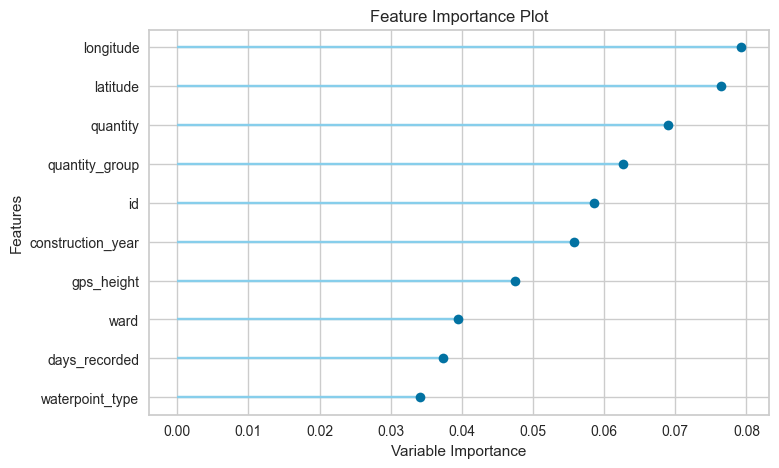

In [92]:
plot_model(model_rf, plot="feature")

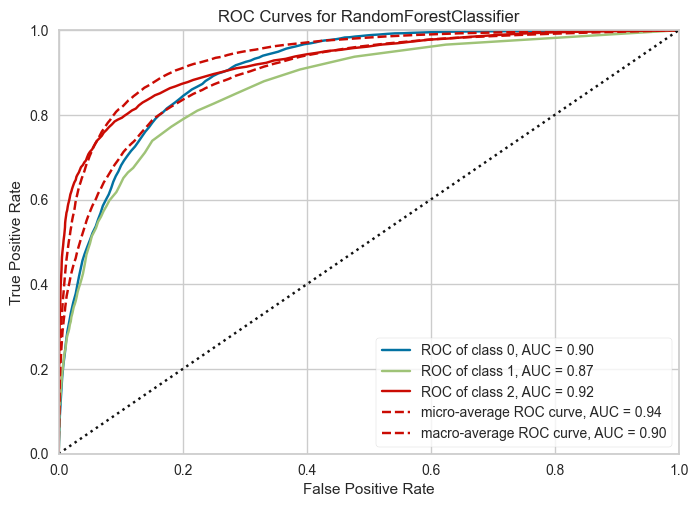

In [93]:
plot_model(model_rf, plot="auc")

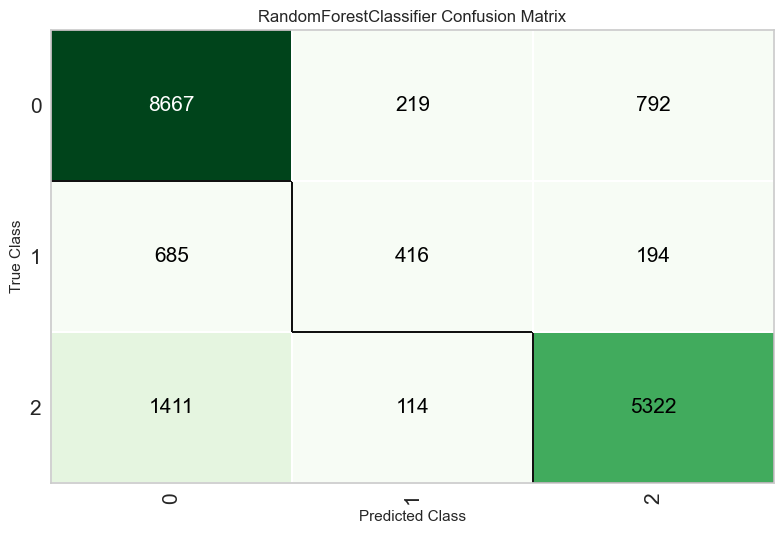

In [94]:
plot_model(model_rf, plot="confusion_matrix")

El modelo obtenido con pycaret está bastante bien, con una media de accuracy de 0.80 aproximadamente y unas curvas ROC para las tres clases bastante buenas (0.90, 0.87 y 0.92). Por último, en la matriz de confusión vemos que tanto los 0 como los 2 acierta bastante, aunque es cierto que preocupa un poco los fallos que tiene al detectar 0 y 2, ya hay 1411 doses que ha registrado erroneamente como 0 y 798 ceros que ha registrado como 2. 

Adicionalmente, la clase 1 al ser la clase minoritaria ("functional needs repair") es la que presenta el menor número de aciertos y fallos que el resto, tal vez un rebalanceo de datos pueda aumentarnos la puntuación en el concurso.

## Modelo Basico

Personalmente, he tenido muchos problemas con pycaret durante el desarrollo de este ejercicio, así que aunque haya hecho su random forest, procedo a realizar uno de forma manual dividiendo el conjunto de training en training y test para poder tener metricas comparables con el resto de random forest que voy a lanzar.

In [143]:
X_train, X_test, y_train, y_test = train_test_split(training,
                                                   var_y,
                                                   test_size=0.2,
                                                   random_state=42,
                                                   stratify=var_y)

In [144]:
model = RandomForestClassifier().fit(X_train,y_train)
y_pred = model.predict(X_test)

In [145]:
results = cross_val_score(estimator=model_rf, X=X_train, y=y_train, cv=5)

In [146]:
results

array([0.80418771, 0.80271465, 0.80955387, 0.80587121, 0.80555556])

In [147]:
print(results.mean())
print(results.std())

0.8055765993265993
0.0022814786615647266


In [148]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.80      0.90      0.85      6452
           1       0.58      0.31      0.40       863
           2       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.74      0.66      0.69     11880
weighted avg       0.81      0.81      0.80     11880



El modelo no está sobreajustado, lo podemos valorar con la validación cruzada repetida la cual da en torno a 0.80. Además, la desviación típica de los resultados es del 0.03, por lo que parece que vamos por buen camino.

Por último, vemos que tiene un accuracy sobre el F1 score del 0.81, bastante bien. Fijemonos que precision y recall de la clase 0 es muy bueno, así como de la clase 2 aunque con un recall algo mas bajo de lo deseado. Aun con ello, ambas metricas para la clase 1 son muy bajas, veremos si conseguimos balancear esa clase y mejorarlo.

## Modelo con Seleccion

Aunque creo que debo ir con todas las variables a modelo, me planteo hacer una seleccion automatica de variables por ver si consigo ganarle algo a mi modelo anterior.

La planteamos con las 20 mejores.

In [149]:
final_features = ['funder', 'installer', 'wpt_name', 'basin', 'region', 'region_code',
       'district_code', 'lga', 'ward', 'public_meeting', 'recorded_by',
       'scheme_management', 'permit', 'extraction_type_group',
       'extraction_type_class', 'management', 'management_group', 'payment',
       'payment_type', 'water_quality', 'quality_group', 'quantity', 'source',
       'source_class', 'waterpoint_type', 'status_group', 'diferenciar', 'id',
       'amount_tsh', 'gps_height', 'longitude', 'latitude', 'population',
       'construction_year', 'days_recorded', 'month_recorded',
       'year_recorded']

In [150]:
selection = SelectKBest(k=20)
feature_selection = selection.fit_transform(training, var_y)

variables = list(np.array(list(training))[selection.get_support()])
variables.sort()
print(variables)

['amount_tsh', 'construction_year', 'extraction_type', 'extraction_type_class', 'extraction_type_group', 'gps_height', 'lga', 'quality_group', 'quantity', 'quantity_group', 'region', 'region_code', 'scheme_management', 'source', 'source_class', 'source_type', 'ward', 'waterpoint_type', 'waterpoint_type_group', 'wpt_name']


In [151]:
X_train, X_test, y_train, y_test = train_test_split(training[variables],
                                                   var_y,
                                                   test_size=0.2,
                                                   random_state=42,
                                                   stratify=var_y)

In [152]:
model_selection = RandomForestClassifier().fit(X_train, y_train)
y_pred = model_selection.predict(X_test)

In [153]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.79      0.86      0.83      6452
           1       0.49      0.31      0.38       863
           2       0.80      0.76      0.78      4565

    accuracy                           0.78     11880
   macro avg       0.70      0.64      0.66     11880
weighted avg       0.77      0.78      0.78     11880



In [154]:
results_selection = cross_val_score(estimator=model_rf, X=X_train, y=y_train, cv=5)

In [155]:
results_selection

array([0.77220118, 0.77872475, 0.78440657, 0.77840909, 0.77556818])

In [156]:
print(results_selection.mean())
print(results_selection.std())

0.7778619528619528
0.004029428836667159


Los resultados son claramente peores, se confirma que si quiero el máximo score debo ir con todas las variables posibles a modelo.

## Modelo con Oversampling

Vamos a intentar realizar un Oversampling a la clase minoritaria con el fin de aplicar un rebalanceo de clases y mejorar las métricas.

In [157]:
training["region_code"]=training["region_code"].astype("int64")
training["district_code"]=training["district_code"].astype("int64")

print("Before Oversampling, counts of label 0: {}".format(sum(var_y==0)))
print("Before Oversampling, counts of label 1: {}".format(sum(var_y==1)))
print("Before Oversampling, counts of label 2: {}".format(sum(var_y==2)))

sm = SMOTE(random_state=2,sampling_strategy={1:15000})
training_res, var_y_res = sm.fit_resample(training, var_y.ravel())

print("After Oversampling, shape of training: {}".format(training_res.shape))
print("After Oversampling, shape of var_y: {}".format(var_y_res.shape))

print("After Oversampling, counts of label 0: {}".format(sum(var_y_res==0)))
print("After Oversampling, counts of label 1: {}".format(sum(var_y_res==1)))
print("After Oversampling, counts of label 2: {}".format(sum(var_y_res==2)))

Before Oversampling, counts of label 0: 32259
Before Oversampling, counts of label 1: 4317
Before Oversampling, counts of label 2: 22824
After Oversampling, shape of training: (70083, 39)
After Oversampling, shape of var_y: (70083,)
After Oversampling, counts of label 0: 32259
After Oversampling, counts of label 1: 15000
After Oversampling, counts of label 2: 22824


In [158]:
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(training_res,
                                                   var_y_res,
                                                   test_size=0.2,
                                                   random_state=42,
                                                   stratify=var_y_res)

In [159]:
model_oversampling = RandomForestClassifier().fit(X_train_res, y_train_res)
y_pred_res = model_oversampling.predict(X_test_res)

In [160]:
print(classification_report(y_test_res,y_pred_res))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      6452
           1       0.88      0.82      0.85      3000
           2       0.85      0.78      0.81      4565

    accuracy                           0.84     14017
   macro avg       0.85      0.83      0.84     14017
weighted avg       0.84      0.84      0.84     14017



In [161]:
results_oversampling = cross_val_score(estimator=model_rf, X=X_train_res, y=y_train_res, cv=5)

In [162]:
results_oversampling

array([0.8282504 , 0.82778917, 0.830643  , 0.83474538, 0.83189155])

In [163]:
print(results_oversampling.mean())
print(results_oversampling.std())

0.830663903497703
0.002539886619568069


Las métricas son muy buenas, de hecho son las mejores pero hay un problema y es que al realizar la partición en x_train, y_train..., lo que hacemos es oversampling tambien al test ya que tira desde nuestro training_res. Eso no quiere decir que con este método no consigamos un buen score: 0.8149, pero dicho score es menor que el que conseguimos al final del ejericicio.

# Modelo con tuneo de hiperparametros

Por último, se intenta un tuneo de hiperparametros a ver si conseguimos mejores resultados:

In [164]:
grid_param = {
    "n_estimators": [100,200,300,400],
    "criterion": ["gini", "entropy"],
    "bootstrap": [True,False]
}

In [165]:
model_grid = GridSearchCV(estimator=model,
                         param_grid=grid_param,
                         scoring="f1",
                         cv=5,
                         n_jobs=-1)

In [166]:
model_grid.fit(training,var_y)
print(model_grid.best_params_)
print(model_grid.best_score_)

{'bootstrap': True, 'criterion': 'gini', 'n_estimators': 100}
nan


In [180]:
X_train, X_test, y_train, y_test = train_test_split(training,
                                                   var_y,
                                                   test_size=0.2,
                                                   random_state=42,
                                                   stratify=var_y)

In [181]:
model_hiper = RandomForestClassifier(bootstrap = True, criterion = "gini", n_estimators = 100).fit(X_train, y_train)
y_pred = model_hiper.predict(X_test)

In [182]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85      6452
           1       0.58      0.31      0.41       863
           2       0.85      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.69     11880
weighted avg       0.81      0.81      0.80     11880



In [183]:
results_hiper = cross_val_score(estimator=model_rf, X=X_train, y=y_train, cv=5)

In [184]:
results_hiper

array([0.80418771, 0.80271465, 0.80955387, 0.80587121, 0.80555556])

In [185]:
print(results_hiper.mean())
print(results_hiper.std())

0.8055765993265993
0.0022814786615647266


El resultado es idéntico al del primer modelo básico RandomForest sin tunear los hiperparametros

# Final

Realizando pruebas y numerosos cambios (se pueden ver todas las submissions realizadas en mi perfil), se ha llegado a la conclusión de que la prueba con la que se llega a la mayor puntuación es mediante un RandomForest sin tuneo de hiperparametros ni rebalanceo de clases, llegando así a un total de **0.8176**.

In [205]:
model = RandomForestClassifier().fit(training,var_y)
y_pred = model.predict(test)

In [206]:
prediction = pd.DataFrame(test["id"],columns = ["id"])

In [207]:
prediction["status_group"] = y_pred

In [208]:
prediction.status_group.replace((0,1,2),("functional","functional needs repair","non functional"), inplace=True)

In [209]:
prediction.sort_values(by=["status_group"])

,id,status_group
7424,19540,functional
6938,33434,functional
6939,60846,functional
6940,14650,functional
6941,50744,functional
...,...,...
7289,43457,non functional
7287,2159,non functional
7282,2358,non functional
7346,12034,non functional


In [211]:
prediction.to_csv("Subformat.csv", index=False)

Adjunto además en archivo aparte dos capturas de pantalla para que se puedan ver la mayor puntuación obtenida mediante este jupyter notebook así como todos los intentos y diferentes pruebas realizadas, en las que no solo se han probado diferentes modelos sino también diferentes métodos de depuración, añadiendo o quitando variables, imputando missings de diferente manera...

Sin embargo, al final de todo, este proceso es por el cual he podido conseguir mi máxima puntuación.